In [103]:
import polars as pl
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn.objects as so
from datetime import datetime

In [13]:
df = pl.read_csv(
    "skillconer.csv", 
    has_header = True, 
    separator = ";", 
    quote_char = '"'
    )

In [14]:
df_original = df.clone()

In [15]:
df = df.drop("Player", "Short Name", "Match", "Competition", "Competition", "Season", "Season ID", "Competition Edition ID",
       "Physical Check Passed");

In [16]:
df.head(n=2)

Player ID,Birthdate,Team ID,Match ID,Date,Competition ID,Position,Position Group,Minutes,Distance,M/min,Running Distance,HSR Distance,HSR Count,Sprint Distance,Sprint Count,HI Distance,HI Count,Medium Acceleration Count,High Acceleration Count,Medium Deceleration Count,High Deceleration Count,Explosive Acceleration to HSR Count,Time to HSR,Explosive Acceleration to Sprint Count,Time to Sprint,PSV-99,Distance P90,M/min P90,Running Distance P90,HSR Distance P90,HSR Count P90,Sprint Distance P90,Sprint Count P90,HI Distance P90,HI Count P90,Medium Acceleration Count P90,High Acceleration Count P90,Medium Deceleration Count P90,High Deceleration Count P90,Explosive Acceleration to HSR Count P90,Explosive Acceleration to Sprint Count P90
i64,str,i64,i64,str,i64,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1266,"""1994-11-07""",16,1732575,"""2024-09-22""",16,"""CF""","""Center Forward""",69.88,7743.0,110.8,940.0,593.0,69.0,321.0,21.0,914.0,90.0,86.0,9.0,59.0,24.0,7.0,"""0.75""",6.0,"""1.44""",31.0,9971.91,110.8,1210.59,763.7,88.86,413.4,27.05,1177.1,115.91,110.76,11.59,75.98,30.91,9.02,7.73
1266,"""1994-11-07""",16,1835409,"""2024-11-02""",16,"""CF""","""Center Forward""",73.35,8628.0,117.63,1179.0,605.0,64.0,307.0,16.0,912.0,80.0,89.0,7.0,77.0,18.0,6.0,"""0.64""",3.0,"""1.14""",31.6,10586.5,117.63,1446.63,742.33,78.53,376.69,19.63,1119.02,98.16,109.2,8.59,94.48,22.09,7.36,3.68


In [17]:
df.describe()

statistic,Player ID,Birthdate,Team ID,Match ID,Date,Competition ID,Position,Position Group,Minutes,Distance,M/min,Running Distance,HSR Distance,HSR Count,Sprint Distance,Sprint Count,HI Distance,HI Count,Medium Acceleration Count,High Acceleration Count,Medium Deceleration Count,High Deceleration Count,Explosive Acceleration to HSR Count,Time to HSR,Explosive Acceleration to Sprint Count,Time to Sprint,PSV-99,Distance P90,M/min P90,Running Distance P90,HSR Distance P90,HSR Count P90,Sprint Distance P90,Sprint Count P90,HI Distance P90,HI Count P90,Medium Acceleration Count P90,High Acceleration Count P90,Medium Deceleration Count P90,High Deceleration Count P90,Explosive Acceleration to HSR Count P90,Explosive Acceleration to Sprint Count P90
str,f64,str,f64,f64,str,f64,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""",4743.0,"""4743""",4743.0,4743.0,"""4743""",4743.0,"""4743""","""4743""",4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,"""4743""",4743.0,"""4743""",4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0,4743.0
"""null_count""",0.0,"""0""",0.0,0.0,"""0""",0.0,"""0""","""0""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""0""",0.0,"""0""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""mean""",124082.077588,null,191.290955,1.8607e6,null,16.0,null,null,90.917921,10369.747206,114.481914,1507.938436,571.675733,53.801392,173.484082,10.059667,745.159814,63.861058,112.516762,6.239089,92.97976,16.164664,4.413662,null,1.398904,null,28.597639,10303.376097,114.481914,1505.799785,572.881244,53.914303,173.814902,10.078014,746.696184,63.992298,111.839989,6.235191,92.426601,16.160926,4.415187,1.403692
"""std""",208000.864411,null,410.231097,133975.384465,null,0.0,null,null,12.253595,1391.469106,9.263549,366.751826,177.525813,16.214589,101.286722,5.278257,251.905925,20.905036,18.508473,3.122714,16.781965,5.763481,2.812216,null,1.558725,null,1.76516,833.716624,9.263549,356.638838,179.111546,16.383227,101.658523,5.303783,253.073172,21.074569,14.25532,3.12282,13.658941,5.714997,2.831691,1.574265
"""min""",1266.0,"""1987-04-24""",6.0,1.620968e6,"""2024-07-26""",16.0,"""AM""","""Center Forward""",60.0,5924.0,85.05,566.0,114.0,12.0,0.0,0.0,127.0,12.0,52.0,0.0,32.0,4.0,0.0,"""0.51""",0.0,"""0.92""",22.7,7654.46,85.05,611.96,104.25,11.89,0.0,0.0,116.14,13.3,73.95,0.0,46.55,3.72,0.0,0.0
"""25%""",18941.0,null,14.0,1.742993e6,null,16.0,null,null,82.27,9522.0,107.72,1235.0,445.0,42.0,97.0,6.0,560.0,48.0,100.0,4.0,81.0,12.0,2.0,null,0.0,null,27.4,9695.1,107.72,1228.97,439.04,41.34,95.06,6.04,555.29,47.52,101.65,3.78,82.65,11.86,2.46,0.0
"""50%""",32398.0,null,17.0,1.889302e6,null,16.0,null,null,96.4,10568.0,114.63,1463.0,557.0,52.0,155.0,9.0,722.0,62.0,113.0,6.0,93.0,15.0,4.0,null,1.0,null,28.5,10316.76,114.63,1484.01,566.99,53.46,155.62,9.17,731.4,62.54,110.97,5.55,91.86,15.31,3.85,0.94
"""75%""",105825.0,null,27.0,1.999903e6,null,16.0,null,null,99.73,11408.0,121.17,1761.0,687.0,65.0,233.0,13.0,909.0,77.0,125.0,8.0,104.0,19.0,6.0,null,2.0,null,29.8,10905.3,121.17,1747.09,692.06,65.61,235.57,13.43,923.89,78.79,120.99,7.94,101.27,19.59,6.04,2.09
"""max""",981644.0,"""2007-12-17""",1544.0,2.010318e6,"""2025-04-06""",16.0,"""RWB""","""Wide Attacker""",117.77,13920.0,151.2,2790.0,1348.0,116.0,619.0,35.0,1738.0,145.0,181.0,26.0,151.0,47.0,19.0,"""null""",10.0,"""null""",34.7,13607.57,151.2,2919.82,1368.78,139.34,606.77,34.21,1946.62,173.49,170.03,26.44,153.63,42.37,22.87,10.94


In [7]:
df_numeric = df.select([pl.col(c) for c in df.columns if df[c].dtype in [pl.Int64, pl.Float64]])
df_numeric

Player ID,Team ID,Match ID,Competition ID,Minutes,Distance,M/min,Running Distance,HSR Distance,HSR Count,Sprint Distance,Sprint Count,HI Distance,HI Count,Medium Acceleration Count,High Acceleration Count,Medium Deceleration Count,High Deceleration Count,Explosive Acceleration to HSR Count,Explosive Acceleration to Sprint Count,PSV-99,Distance P90,M/min P90,Running Distance P90,HSR Distance P90,HSR Count P90,Sprint Distance P90,Sprint Count P90,HI Distance P90,HI Count P90,Medium Acceleration Count P90,High Acceleration Count P90,Medium Deceleration Count P90,High Deceleration Count P90,Explosive Acceleration to HSR Count P90,Explosive Acceleration to Sprint Count P90
i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1266,16,1732575,16,69.88,7743.0,110.8,940.0,593.0,69.0,321.0,21.0,914.0,90.0,86.0,9.0,59.0,24.0,7.0,6.0,31.0,9971.91,110.8,1210.59,763.7,88.86,413.4,27.05,1177.1,115.91,110.76,11.59,75.98,30.91,9.02,7.73
1266,16,1835409,16,73.35,8628.0,117.63,1179.0,605.0,64.0,307.0,16.0,912.0,80.0,89.0,7.0,77.0,18.0,6.0,3.0,31.6,10586.5,117.63,1446.63,742.33,78.53,376.69,19.63,1119.02,98.16,109.2,8.59,94.48,22.09,7.36,3.68
1266,16,1876091,16,80.07,8829.0,110.27,1260.0,681.0,77.0,355.0,23.0,1036.0,100.0,97.0,9.0,72.0,17.0,5.0,3.0,30.8,9924.35,110.27,1416.32,765.49,86.55,399.04,25.85,1164.53,112.41,109.03,10.12,80.93,19.11,5.62,3.37
1266,16,1936035,16,75.22,8997.0,119.61,1412.0,550.0,60.0,221.0,14.0,771.0,74.0,107.0,9.0,80.0,22.0,7.0,1.0,28.0,10765.3,119.61,1689.52,658.1,71.79,264.44,16.75,922.53,88.54,128.03,10.77,95.72,26.32,8.38,1.2
1266,16,1964899,16,100.28,10617.0,105.87,1312.0,637.0,79.0,461.0,23.0,1098.0,102.0,109.0,11.0,81.0,26.0,8.0,6.0,31.3,9528.3,105.87,1177.46,571.68,70.9,413.73,20.64,985.41,91.54,97.82,9.87,72.69,23.33,7.18,5.38
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
940662,462,1819603,16,92.73,11772.0,126.94,1973.0,810.0,67.0,144.0,9.0,954.0,76.0,160.0,4.0,131.0,26.0,4.0,4.0,27.2,11425.02,126.94,1914.85,786.13,65.03,139.76,8.73,925.88,73.76,155.28,3.88,127.14,25.23,3.88,3.88
940662,462,1834539,16,77.1,10498.0,136.16,2164.0,865.0,54.0,58.0,6.0,923.0,60.0,115.0,4.0,101.0,18.0,3.0,0.0,25.5,12254.47,136.16,2526.07,1009.73,63.04,67.7,7.0,1077.43,70.04,134.24,4.67,117.9,21.01,3.5,0.0
940662,462,1846855,16,90.22,11223.0,124.4,1849.0,646.0,51.0,78.0,7.0,724.0,58.0,159.0,3.0,127.0,20.0,2.0,1.0,25.7,11196.05,124.4,1844.56,644.45,50.88,77.81,6.98,722.26,57.86,158.62,2.99,126.69,19.95,2.0,1.0


In [8]:
dfp_numeric = df_numeric.to_pandas()

In [ ]:
sns.pairplot(dfp_numeric)

In [9]:
corr = dfp_numeric.corr()

<Axes: >

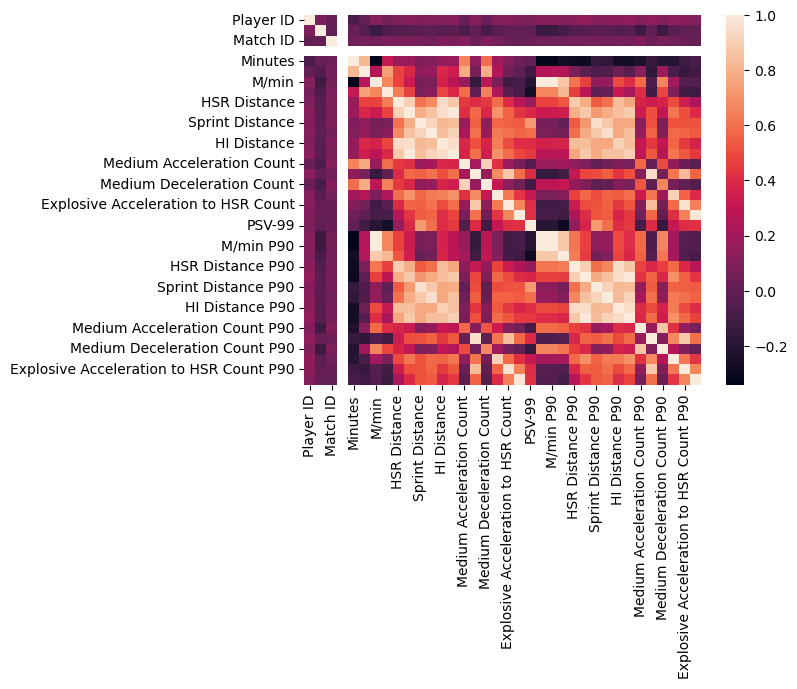

In [10]:
sns.heatmap(corr)

In [23]:
GroupedByPosition = df.group_by("Position")

In [28]:
GroupedByPosition.agg(pl.all().mean())

Position,Player ID,Birthdate,Team ID,Match ID,Date,Competition ID,Position Group,Minutes,Distance,M/min,Running Distance,HSR Distance,HSR Count,Sprint Distance,Sprint Count,HI Distance,HI Count,Medium Acceleration Count,High Acceleration Count,Medium Deceleration Count,High Deceleration Count,Explosive Acceleration to HSR Count,Time to HSR,Explosive Acceleration to Sprint Count,Time to Sprint,PSV-99,Distance P90,M/min P90,Running Distance P90,HSR Distance P90,HSR Count P90,Sprint Distance P90,Sprint Count P90,HI Distance P90,HI Count P90,Medium Acceleration Count P90,High Acceleration Count P90,Medium Deceleration Count P90,High Deceleration Count P90,Explosive Acceleration to HSR Count P90,Explosive Acceleration to Sprint Count P90
str,f64,str,f64,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""RCB""",79019.220859,null,195.828221,1.8621e6,null,16.0,null,96.108528,10219.208589,106.488528,1273.730061,419.01227,39.546012,114.075665,6.877301,533.087935,46.423313,111.817996,5.153374,89.353783,13.163599,3.339468,null,0.981595,null,28.305726,9583.962331,106.488528,1195.608425,392.926135,37.067117,106.531493,6.429059,499.45771,43.496135,104.825297,4.832597,83.792679,12.352127,3.131616,0.910204
"""DM""",124314.142857,null,128.102041,1.8422e6,null,16.0,null,94.967959,11471.537415,121.022993,1853.428571,569.326531,50.0,117.904762,6.904762,687.231293,56.904762,122.081633,4.326531,106.108844,15.006803,2.77551,null,0.612245,null,27.489796,10892.103401,121.022993,1765.565442,542.677279,47.546939,112.257483,6.570136,654.935102,54.116463,115.908503,4.107075,100.651224,14.268367,2.618912,0.577551
"""AM""",95482.310204,null,207.808163,1.8670e6,null,16.0,null,88.319347,10655.244898,121.081184,1778.032653,637.62449,56.632653,153.510204,9.138776,791.134694,65.771429,109.955102,4.457143,93.493878,15.134694,2.991837,null,0.869388,null,27.821633,10897.323388,121.081184,1824.633673,654.779633,58.158408,157.280327,9.347265,812.059878,67.505714,112.675837,4.581633,95.711347,15.543061,3.057347,0.901837
"""LWB""",168940.978448,null,180.74569,1.8520e6,null,16.0,null,90.356207,10639.051724,117.915259,1641.607759,725.594828,67.831897,261.711207,14.659483,987.306034,82.491379,121.487069,8.487069,101.280172,21.185345,6.349138,null,2.142241,null,29.514655,10612.367759,117.915259,1639.18556,724.41056,67.697371,261.918319,14.646638,986.328319,82.343707,121.177155,8.445647,100.92319,21.172241,6.318621,2.151466
"""RW""",67971.147186,null,206.229437,1.8709e6,null,16.0,null,85.065195,9972.844156,117.492208,1507.160173,662.640693,63.982684,231.835498,13.082251,894.47619,77.064935,106.004329,7.515152,86.515152,18.298701,5.649351,null,1.991342,null,29.22987,10574.297662,117.492208,1601.565065,704.167143,67.945238,245.084416,13.848831,949.251905,81.79381,112.525714,7.979177,91.805238,19.427489,6.01039,2.089437
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""RB""",141275.471074,null,197.004132,1.8693e6,null,16.0,null,91.952314,10428.330579,113.717686,1469.933884,653.053719,63.876033,256.132231,14.099174,909.18595,77.975207,117.066116,7.834711,96.871901,19.966942,6.086777,null,2.305785,null,29.607851,10234.583264,113.717686,1447.990207,641.645992,62.524215,249.724256,13.739669,891.370289,76.263884,115.106488,7.658264,95.18314,19.583802,5.961942,2.220331
"""LDM""",195283.358491,null,196.710692,1.8756e6,null,16.0,null,92.199497,10946.962264,119.063836,1723.754717,547.477987,48.427673,116.968553,6.893082,664.446541,55.320755,114.18239,4.207547,98.503145,12.874214,2.616352,null,0.628931,null,27.534591,10715.773899,119.063836,1690.561195,539.027736,47.704465,116.029874,6.854214,655.057044,54.558616,112.006164,4.15195,96.588931,12.665283,2.606101,0.645346
"""LM""",140460.019048,null,180.273016,1.8522e6,null,16.0,null,89.756444,10857.660317,121.277079,1823.949206,575.653968,50.257143,115.507937,6.95873,691.161905,57.215873,115.561905,4.

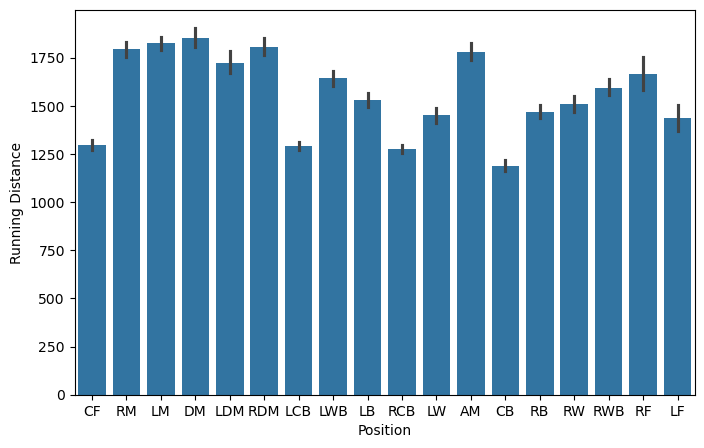

In [39]:
plt.figure(figsize=(8, 5))
sns.barplot(data=df, x="Position", y="Running Distance")
plt.show()

In [83]:
HSR_ranking = (
    df.group_by(["Position"])
      .agg([pl.mean("HSR Distance").alias("HSR_Distance")])
      .sort("HSR_Distance")
)
HSR_ranking

Position,HSR_Distance
str,f64
"""CB""",385.159664
"""RCB""",419.01227
"""LCB""",443.762605
"""LDM""",547.477987
"""DM""",569.326531
…,…
"""RW""",662.640693
"""LB""",662.882114
"""RWB""",683.178571


### Stacked barplot

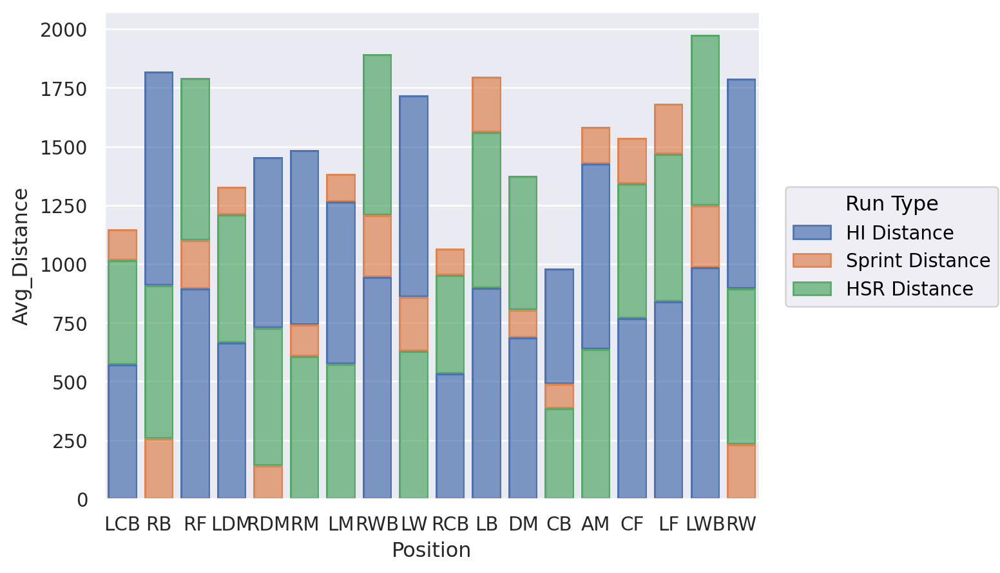

In [87]:
#creating df to be used as input for the stacked barplot

df_hsr = df["Position", "HSR Distance"]
df_hsr = df.select(["Position", "HSR Distance"]).rename({"HSR Distance": "Distance"}).with_columns(
    pl.lit("HSR Distance").alias("Run Type")
)

#df_hsr

df_sd = df["Position", "Sprint Distance"]
df_sd = df.select(["Position", "Sprint Distance"]).rename({"Sprint Distance": "Distance"}).with_columns(
    pl.lit("Sprint Distance").alias("Run Type")
)
#df_sd

df_hi = df["Position", "HI Distance"]
df_hi = df.select(["Position", "HI Distance"]).rename({"HI Distance": "Distance"}).with_columns(
    pl.lit("HI Distance").alias("Run Type")
)
#df_hi

df_stack = df_hsr.vstack(df_sd).vstack(df_hi)
df_stack

GroupedByPosition2 = df_stack.group_by(["Position", "Run Type"]).agg(
    pl.col("Distance").mean().alias("Avg_Distance")
)


so.Plot(GroupedByPosition2, x="Position", y="Avg_Distance", color="Run Type").add(so.Bar(),so.Stack())


<Axes: xlabel='Position', ylabel='Distance'>

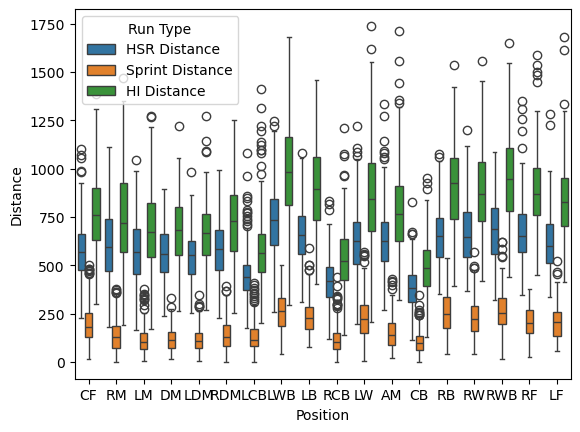

In [85]:
sns.boxplot(data=df_stack, x="Position", y="Distance", hue="Run Type")

In [90]:
regplot = (
    df.plot.point(
        x = "HSR Distance",
        y = "HSR Count",
        color = "Position Group",
    )
    .properties(width=500, title="HSR Distance vs Count between positions")
    .configure_scale(zero=False)
)
regplot.encoding.x.title = "HSR Distance (m)"
regplot.encoding.y.title = "HSR Count"
regplot

alt.Chart(...)

In [91]:
regplot = (
    df.plot.point(
        x = "Sprint Distance",
        y = "Sprint Count",
        color = "Position Group",
    )
    .properties(width=500, title="HSR Distance vs Count between positions")
    .configure_scale(zero=False)
)
regplot.encoding.x.title = "HSR Distance (m)"
regplot.encoding.y.title = "HSR Count"
regplot

alt.Chart(...)

([<matplotlib.axis.YTick at 0x7f0f788bc7a0>,
 [Text(0, 0, '0'), Text(0, 100, '100'), Text(0, 200, '200')])

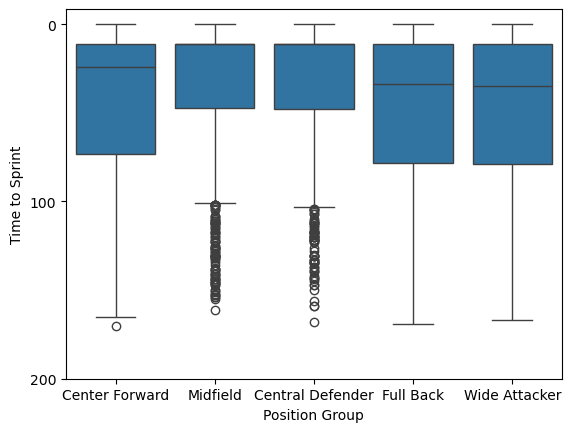

In [102]:
sns.boxplot(data=df, x="Position Group", y="Time to Sprint")
#sns.boxplot(data=df, x="Time to Sprint", y="Position Group")
plt.yticks(ticks=[0, 100, 200], labels=["0", "100", "200"])


In [127]:
target_date = datetime(2000, 1, 1)
"""
df = df.with_columns(
    pl.col("Birthdate")
    .str.strptime(pl.Date, "%Y-%m-%d")  # Convert Birthdate from string to date format
    .alias("Birthdate")
)
"""
df = df.with_columns(
    pl.when(pl.col("Birthdate") > target_date).then(1)
    .when(pl.col("Birthdate") < target_date).then(2)
    .otherwise(-1)
    .alias("birthdate_coded2")
)

In [130]:
df['birthdate_coded2'].describe()

statistic,value
str,f64
"""count""",4743.0
"""null_count""",0.0
"""mean""",1.437065
"""std""",0.518523
"""min""",-1.0
"""25%""",1.0
"""50%""",1.0
"""75%""",2.0
"""max""",2.0


([<matplotlib.axis.YTick at 0x7f0f585e2ea0>,
 [Text(0, 0, '0'), Text(0, 100, '100'), Text(0, 200, '200')])

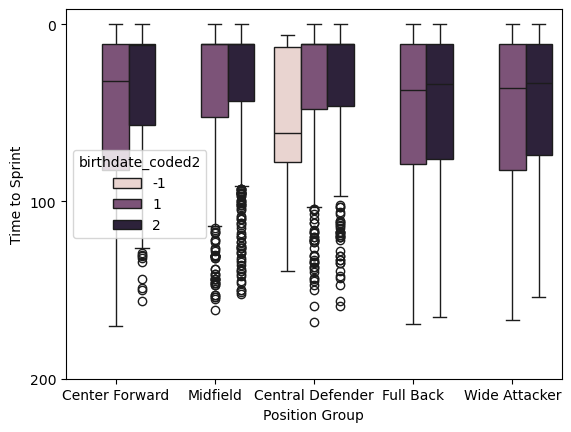

In [128]:
sns.boxplot(data=df, x="Position Group", y="Time to Sprint", hue="birthdate_coded2")

#sns.boxplot(data=df, x="Time to Sprint", y="Position Group")
plt.yticks(ticks=[0, 100, 200], labels=["0", "100", "200"])